In [1]:
pip install patchify

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install -U segmentation-models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

In [4]:
from patchify import patchify, unpatchify


In [5]:
import segmentation_models as sm # I need base version and tf.keras framework


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

Segmentation Models: using `tf.keras` framework.


In [6]:
import os
import cv2
from PIL import Image
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from matplotlib import pyplot as plt
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [7]:
pip install -U segmentation-models==0.2.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 3.9 MB/s eta 0:00:00
  Attempting uninstall: image-classifiers
    Found existing installation: image-classifiers 1.0.0
    Uninstalling image-classifiers-1.0.0:
      Successfully uninstalled image-classifiers-1.0.0
  Attempting uninstall: segmentation-models
    Found existing installation: segmentation-models 1.0.1
    Uninstalling segmentation-models-1.0.1:
      Successfully uninstalled segmentation-models-1.0.1
Note: you may need to restart the kernel to use updated packages.


In [8]:
dataset_root_folder = '/kaggle/input/semantic-segmentation-of-aerial-imagery/'
dataset_name = 'Semantic segmentation dataset'

In [9]:
image_patch_size = 256

In [10]:
# image = Image.fromarray(image)
# print(type(image))
# print(image)

In [11]:
# files = os.scandir(dataset_root_folder+dataset_name+"/Tile 1/images")
# print(len([file for file in files]))

In [12]:
image = np.array([[1,2,3,4], [5,6,7,8], [9,10,11,12]])
# print(help(patchify))
print(image[1][3])
patches = patchify(image, (2,2), step=3) # split image into 2*3 small 2*2 patches.
print(type(patches))
print(patches.shape)
# assert patches.shape == (2, 3, 2, 2)
# reconstructed_image = unpatchify(patches, image.shape)

# assert (reconstructed_image == image).all()

8
<class 'numpy.ndarray'>
(1, 1, 2, 2)


In [13]:
# image_id = 1
# image_extension = 'jpg'
# tile_id = 5
# image_type = 'images'
# image = cv2.imread(f'{dataset_root_folder}{dataset_name}/Tile {tile_id}/{image_type}/image_part_00{image_id}.{image_extension}')
# print(image)

In [14]:
minmaxscaler = MinMaxScaler()
image_patch_size = 256
image_dataset = []
mask_dataset = []
for image_type in ['images','masks']:
  if image_type == 'images':
    image_extension = 'jpg'
  else:
    image_extension = 'png'

  for tile_id in range(1,8):

    for image_id in range(1,10):

      image = cv2.imread(f'{dataset_root_folder}{dataset_name}/Tile {tile_id}/{image_type}/image_part_00{image_id}.{image_extension}')
      if image is not None:

        if image_type == 'masks':
          image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)


        # making the size multiple of pat
        size_x = (image.shape[1]//image_patch_size)*image_patch_size
        size_y = (image.shape[0]//image_patch_size)*image_patch_size
        # print(f'{image.shape} - {size_x},{size_y}')

        cropped_image = image[0:size_y, 0:size_x] #cropping on array is faster than converting into image cropping and back

        # image = Image.fromarray(image)
        # image = image.crop((0,0,size_x,size_y)) #topleftx toplefty bottomrightx bottomrighty
        # image = np.array(image)

        patched_images = patchify(image,(image_patch_size,image_patch_size,3),step=image_patch_size)

        for i in range(patched_images.shape[0]):

          for j in range(patched_images.shape[1]):

            if image_type == 'images':
              current_patched_image = patched_images[i,j,0,:]
              current_patched_image = minmaxscaler.fit_transform(current_patched_image.reshape(-1,1)).reshape(current_patched_image.shape) #normalization
              image_dataset.append(current_patched_image)
            else:
              current_patched_mask = patched_images[i,j,0,:]
              mask_dataset.append(current_patched_mask)



In [15]:
image_dataset  = np.array(image_dataset)
mask_dataset  = np.array(mask_dataset)

print(type(image_dataset))
print(type(mask_dataset))

print(image_dataset[0].shape)
print(mask_dataset[0].shape)

print(type(image_dataset[0]))




<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 3)
(256, 256, 3)
<class 'numpy.ndarray'>


In [16]:
print(image_dataset.shape)

(945, 256, 256, 3)


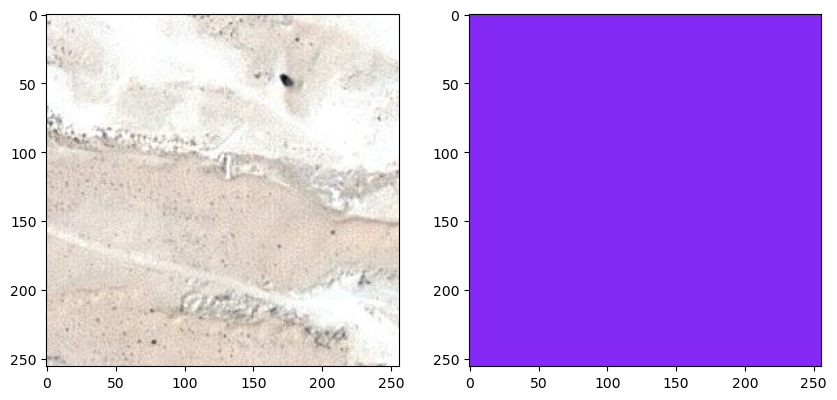

In [17]:
random_image_id = random.randint(0,len(image_dataset))
plt.figure(figsize=(10,8)) #width height
plt.subplot(121) #numRows numColumns Position
plt.imshow(image_dataset[random_image_id])
plt.subplot(122)
plt.imshow(mask_dataset[random_image_id])

In [18]:
class_building  = '#3C1098'.lstrip('#')
class_building = np.array(tuple(int(class_building[i:i+2],16) for i in (0,2,4))) #converting hex to RGB values of color
print(class_building)

class_land  = '#8429F6'.lstrip('#')
class_land = np.array(tuple(int(class_land[i:i+2],16) for i in (0,2,4))) #converting hex to RGB values of color
print(class_land)

class_road  = '#6EC1E4'.lstrip('#')
class_road = np.array(tuple(int(class_road[i:i+2],16) for i in (0,2,4))) #converting hex to RGB values of color
print(class_road)

class_vegetation  = '#FEDD3A'.lstrip('#')
class_vegetation = np.array(tuple(int(class_vegetation[i:i+2],16) for i in (0,2,4))) #converting hex to RGB values of color
print(class_vegetation)

class_water  = '#E2A929'.lstrip('#')
class_water = np.array(tuple(int(class_water[i:i+2],16) for i in (0,2,4))) #converting hex to RGB values of color
print(class_water)

class_unlabelled  = '#9B9B9B'.lstrip('#')
class_unlabelled = np.array(tuple(int(class_unlabelled[i:i+2],16) for i in (0,2,4))) #converting hex to RGB values of color
print(class_unlabelled)

[ 60  16 152]
[132  41 246]
[110 193 228]
[254 221  58]
[226 169  41]
[155 155 155]


In [19]:
print(mask_dataset.shape)
arr = [[1,2,3],[1,5,3]]
print(np.unique(arr))
labl = np.array([1,2,3])
print(labl)
print(arr==labl)
np.all(arr==labl,axis=-1)

(945, 256, 256, 3)
[1 2 3 5]
[1 2 3]
[[ True  True  True]
 [ True False  True]]


array([ True, False])

label == class_water will generate a matrix of shape 256 * 256 * 3 that will contain true or false values.
Since class_water is of shape 1*3, every cell will have same values at the third dimension i.e either all true or all false.

np.all function will return you a two vector of 256 * 256 with true or false. At those indexes I will mark the labelsegment of respective mask

In [20]:
def rgb_to_label(label):
  label_segment = np.zeros(label.shape,dtype = np.uint8)
  label_segment[np.all(label == class_water, axis=-1)] = 0
  label_segment[np.all(label == class_land, axis=-1)] = 1
  label_segment[np.all(label == class_road, axis=-1)] = 2
  label_segment[np.all(label == class_building, axis=-1)] = 3
  label_segment[np.all(label == class_vegetation, axis=-1)] = 4
  label_segment[np.all(label == class_unlabelled, axis=-1)] = 5
  label_segment = label_segment[:,:,0]
  return label_segment

In [21]:
labels = []
for i in range(mask_dataset.shape[0]):
  label = rgb_to_label(mask_dataset[i])
  labels.append(label)

In [22]:
print(len(labels))
print(labels[0].shape)
print(labels[0])
labels = np.array(labels)

945
(256, 256)
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]


In [23]:
# print(labels)
# print(labels[3])

In [24]:
labels = np.expand_dims(labels,axis=3)
# print(labels)

In [25]:
print("Total unique values {}".format(np.unique(labels)))
print(labels.shape)

Total unique values [0 1 2 3 4 5]
(945, 256, 256, 1)


In [26]:
# colValues = np.array([[1,2,1],[2,1,2],[1,2,1]])
# plt.imshow(colValues)

In [27]:
total_classes = len(np.unique(labels))
print(total_classes)
print(labels[0,0,0])

6
[1]


In [28]:
# values = [[1,2,3],[4,5,6]]
# cat_values = to_categorical(values,7)
# print(cat_values)

In [29]:
labels_categorical_dataset = to_categorical(labels,num_classes=total_classes) # converting 1 to 0,1,0,0,0,0
print(labels_categorical_dataset.shape)
print(labels_categorical_dataset[0][0][0])


(945, 256, 256, 6)
[0. 1. 0. 0. 0. 0.]


In [30]:
# master_training_dataset = image_dataset
# print(master_training_dataset.shape)

In [31]:
X_train, X_test, y_train, y_test = train_test_split(image_dataset,labels_categorical_dataset,test_size=0.15,random_state=100)

In [32]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(803, 256, 256, 3)
(142, 256, 256, 3)
(803, 256, 256, 6)
(142, 256, 256, 6)


In [33]:
image_height = X_train.shape[1]
image_width = X_train.shape[2]
image_channels = X_train.shape[3]
total_classes = y_train.shape[3]
print(image_height,image_width,image_channels,total_classes)

256 256 3 6


# **Deep Learning part of the Code**

In [34]:
# !pip install -U segmentation_models #-U says, upgrade it, even it is already installed

In [35]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Conv2DTranspose
from keras.layers import concatenate, BatchNormalization, Dropout, Lambda

Keras is not involved in low level or tensor level processing. Those processing are handled by the backend in most cases the Tensorflow backend which does the processing. Keras helps in abstracting out the design of architecture of a neural network. You can say Keras gives an Unfair advantage to developers

In [36]:
from keras import backend as K

Multi - U-Net Architecture

In [37]:
# def multi_unet_model(n_classes=5,image_height=256, image_width = 256, image_channels=1):

#   inputs = Input((image_height,image_width,image_channels)) #defines the input layer of the neural network, creaters a tensor of the specified dimensions
#   print("Input shape",inputs.shape)
#   source_input = inputs

#   c1 = Conv2D(16,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(source_input)
#   print(c1.shape)
#   c1 = Dropout(0.2)(c1)
#   print(c1.shape)
#   c1 = Conv2D(16,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c1)
#   print(c1.shape)
#   p1 = MaxPooling2D((2,2))(c1)
#   print(p1.shape)

#   c2 = Conv2D(32,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(p1)
#   print(c2.shape)
#   c2 = Dropout(0.2)(c2)
#   print(c2.shape)
#   c2 = Conv2D(32,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c2)
#   print(c2.shape)
#   p2 = MaxPooling2D((2,2))(c2)
#   print(p2.shape)

#   c3 = Conv2D(64,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(p2)
#   print(c3.shape)
#   c3 = Dropout(0.2)(c3)
#   print(c3.shape)
#   c3 = Conv2D(64,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c3)
#   print(c3.shape)
#   p3 = MaxPooling2D((2,2))(c3)
#   print(p3.shape)

#   c4 = Conv2D(128,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(p3)
#   print(c4.shape)
#   c4 = Dropout(0.2)(c4)
#   print(c4.shape)
#   c4 = Conv2D(128,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c4)
#   print(c4.shape)
#   p4 = MaxPooling2D((2,2))(c4)
#   print(p4.shape)

#   c5 = Conv2D(256,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(p4)
#   print(c5.shape)
#   c5 = Dropout(0.2)(c5)
#   print(c5.shape)
#   c5 = Conv2D(256,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c5)
#   print(c5.shape)
#   c5 = Conv2D(256,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c5)
#   print(c5.shape)
#   u6 = Conv2DTranspose(128,(2,2),strides=(2,2),padding="same")(c5)
#   print(u6.shape)
#   u6 = concatenate([u6,c4])
#   print(u6.shape)
#   c6 = Conv2D(128,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(u6)
#   print(c6.shape)
#   c6 = Dropout(0.2)(c6)
#   print(c6.shape)
#   c6 = Conv2D(128,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c6)
#   print(c6.shape)

#   u7 = Conv2DTranspose(64,(2,2),strides=(2,2),padding="same")(c6)
#   print(u7.shape)
#   u7 = concatenate([u7,c3])
#   print(u7.shape)
#   c7 = Conv2D(64,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(u7)
#   print(c7.shape)
#   c7 = Dropout(0.2)(c7)
#   print(c7.shape)
#   c7 = Conv2D(64,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c7)
#   print(c7.shape)

#   u8 = Conv2DTranspose(32,(2,2),strides=(2,2),padding="same")(c7)
#   print(u8.shape)
#   u8 = concatenate([u8,c2])
#   print(u8.shape)
#   c8 = Conv2D(32,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(u8)
#   print(c8.shape)
#   c8 = Dropout(0.2)(c8)
#   print(c8.shape)
#   c8 = Conv2D(32,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c8)
#   print(c8.shape)

#   u9 = Conv2DTranspose(16,(2,2),strides=(2,2),padding="same")(c8)
#   print(u9.shape)
#   u9 = concatenate([u9,c1], axis=3)
#   print(u9.shape)
#   c9 = Conv2D(16,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(u9)
#   print(c9.shape)
#   c9 = Dropout(0.2)(c9)
#   print(c9.shape)
#   c9 = Conv2D(16,(3,3),activation="relu",kernel_initializer="he_normal",padding="same")(c9)
#   print(c9.shape)

#   outputs = Conv2D(n_classes,(1,1),activation="softmax")(c9)
#   print(outputs.shape)
#   model = Model(inputs=[inputs],outputs=[outputs])
#   return model


In [38]:
def multi_unet_model(n_classes=5,image_height=256, image_width = 256, image_channels=1):

  inputs = Input((image_height,image_width,image_channels)) #defines the input layer of the neural network, creaters a tensor of the specified dimensions
  print("Input shape",inputs.shape)
  source_input = inputs

  c1 = Conv2D(16,(3,3),activation="relu",padding="same")(source_input)
  print(c1.shape)
  c1 = Dropout(0.2)(c1)
  print(c1.shape)
  c1 = Conv2D(16,(3,3),activation="relu",padding="same")(c1)
  print(c1.shape)
  p1 = MaxPooling2D((2,2))(c1)
  print(p1.shape)

  c2 = Conv2D(32,(3,3),activation="relu",padding="same")(p1)
  print(c2.shape)
  c2 = Dropout(0.2)(c2)
  print(c2.shape)
  c2 = Conv2D(32,(3,3),activation="relu",padding="same")(c2)
  print(c2.shape)
  p2 = MaxPooling2D((2,2))(c2)
  print(p2.shape)

  c3 = Conv2D(64,(3,3),activation="relu",padding="same")(p2)
  print(c3.shape)
  c3 = Dropout(0.2)(c3)
  print(c3.shape)
  c3 = Conv2D(64,(3,3),activation="relu",padding="same")(c3)
  print(c3.shape)
  p3 = MaxPooling2D((2,2))(c3)
  print(p3.shape)

  c4 = Conv2D(128,(3,3),activation="relu",padding="same")(p3)
  print(c4.shape)
  c4 = Dropout(0.2)(c4)
  print(c4.shape)
  c4 = Conv2D(128,(3,3),activation="relu",padding="same")(c4)
  print(c4.shape)
  p4 = MaxPooling2D((2,2))(c4)
  print(p4.shape)

  c5 = Conv2D(256,(3,3),activation="relu",padding="same")(p4)
  print(c5.shape)
  c5 = Dropout(0.2)(c5)
  print(c5.shape)
  c5 = Conv2D(256,(3,3),activation="relu",padding="same")(c5)
  print(c5.shape)
  c5 = Conv2D(256,(3,3),activation="relu",padding="same")(c5)
  print(c5.shape)
  u6 = Conv2DTranspose(128,(2,2),strides=(2,2),padding="same")(c5)
  print(u6.shape)
  u6 = concatenate([u6,c4])
  print(u6.shape)
  c6 = Conv2D(128,(3,3),activation="relu",padding="same")(u6)
  print(c6.shape)
  c6 = Dropout(0.2)(c6)
  print(c6.shape)
  c6 = Conv2D(128,(3,3),activation="relu",padding="same")(c6)
  print(c6.shape)

  u7 = Conv2DTranspose(64,(2,2),strides=(2,2),padding="same")(c6)
  print(u7.shape)
  u7 = concatenate([u7,c3])
  print(u7.shape)
  c7 = Conv2D(64,(3,3),activation="relu",padding="same")(u7)
  print(c7.shape)
  c7 = Dropout(0.2)(c7)
  print(c7.shape)
  c7 = Conv2D(64,(3,3),activation="relu",padding="same")(c7)
  print(c7.shape)

  u8 = Conv2DTranspose(32,(2,2),strides=(2,2),padding="same")(c7)
  print(u8.shape)
  u8 = concatenate([u8,c2])
  print(u8.shape)
  c8 = Conv2D(32,(3,3),activation="relu",padding="same")(u8)
  print(c8.shape)
  c8 = Dropout(0.2)(c8)
  print(c8.shape)
  c8 = Conv2D(32,(3,3),activation="relu",padding="same")(c8)
  print(c8.shape)

  u9 = Conv2DTranspose(16,(2,2),strides=(2,2),padding="same")(c8)
  print(u9.shape)
  u9 = concatenate([u9,c1], axis=3)
  print(u9.shape)
  c9 = Conv2D(16,(3,3),activation="relu",padding="same")(u9)
  print(c9.shape)
  c9 = Dropout(0.2)(c9)
  print(c9.shape)
  c9 = Conv2D(16,(3,3),activation="relu",padding="same")(c9)
  print(c9.shape)

  outputs = Conv2D(n_classes,(1,1),activation="softmax")(c9)
  print(outputs.shape)
  model = Model(inputs=[inputs],outputs=[outputs])
  return model


In [39]:
metrics = ['accuracy']

In [40]:
def get_deep_learning_model():
  return multi_unet_model(n_classes=total_classes,
                          image_height=image_height,
                          image_width=image_width,
                          image_channels=image_channels)

In [41]:
model = get_deep_learning_model()

Input shape (None, 256, 256, 3)
(None, 256, 256, 16)
(None, 256, 256, 16)
(None, 256, 256, 16)
(None, 128, 128, 16)
(None, 128, 128, 32)
(None, 128, 128, 32)
(None, 128, 128, 32)
(None, 64, 64, 32)
(None, 64, 64, 64)
(None, 64, 64, 64)
(None, 64, 64, 64)
(None, 32, 32, 64)
(None, 32, 32, 128)
(None, 32, 32, 128)
(None, 32, 32, 128)
(None, 16, 16, 128)
(None, 16, 16, 256)
(None, 16, 16, 256)
(None, 16, 16, 256)
(None, 16, 16, 256)
(None, 32, 32, 128)
(None, 32, 32, 256)
(None, 32, 32, 128)
(None, 32, 32, 128)
(None, 32, 32, 128)
(None, 64, 64, 64)
(None, 64, 64, 128)
(None, 64, 64, 64)
(None, 64, 64, 64)
(None, 64, 64, 64)
(None, 128, 128, 32)
(None, 128, 128, 64)
(None, 128, 128, 32)
(None, 128, 128, 32)
(None, 128, 128, 32)
(None, 256, 256, 16)
(None, 256, 256, 32)
(None, 256, 256, 16)
(None, 256, 256, 16)
(None, 256, 256, 16)
(None, 256, 256, 6)


In [42]:
model.get_config() #this function is used with keras, and operated on the model returned by that function

{'name': 'model',
 'trainable': True,
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'name': 'input_1',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv2d',
    'trainable': True,
    'dtype': 'float32',
    'filters': 16,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv2d',
   'inbound_nodes': [[['input_1', 0, 0, {}]]]},
  {'class_name': 'Dro

In [43]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 dropout (Dropout)              (None, 256, 256, 16  0           ['conv2d[0][0]']                 
                                )                                                             

In [44]:
# weights = [1/6]*6

In [45]:
# pip install segmentation_models==1.0.1
# print(help(sm.losses.DiceLoss()))

In [46]:
# dice_loss = sm.losses.DiceLoss(class_weights=weights)
# focal_loss = sm.losses.CategoricalFocalLoss()
# total_loss = dice_loss + (1*focal_loss)

Model Compilation

In [47]:
import tensorflow as tf

In [48]:
tf.keras.backend.clear_session()

In [49]:
model.compile(optimizer="adam",loss="categorical_crossentropy",metrics=metrics)

In [50]:
model_history = model.fit(X_train,
                          y_train,
                          batch_size=8,
                          verbose=1,
                          epochs=100,
                          validation_data = (X_test,y_test),
                          shuffle=False)

Epoch 1/100


2023-08-22 17:00:36.944655: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


101/101 [==============================] - 39s 141ms/step - loss: 1.0969 - accuracy: 0.6105 - val_loss: 0.9398 - val_accuracy: 0.6540
Epoch 2/100
101/101 [==============================] - 10s 97ms/step - loss: 0.8444 - accuracy: 0.6949 - val_loss: 0.9563 - val_accuracy: 0.6626
Epoch 3/100
101/101 [==============================] - 10s 98ms/step - loss: 0.7936 - accuracy: 0.7200 - val_loss: 0.9731 - val_accuracy: 0.6660
Epoch 4/100
101/101 [==============================] - 10s 101ms/step - loss: 0.7535 - accuracy: 0.7341 - val_loss: 0.9644 - val_accuracy: 0.6538
Epoch 5/100
101/101 [==============================] - 10s 100ms/step - loss: 0.7684 - accuracy: 0.7341 - val_loss: 0.8192 - val_accuracy: 0.7126
Epoch 6/100
101/101 [==============================] - 10s 101ms/step - loss: 0.7317 - accuracy: 0.7429 - val_loss: 0.7936 - val_accuracy: 0.7097
Epoch 7/100
101/101 [==============================] - 10s 103ms/step - loss: 0.7092 - accuracy: 0.7495 - val_loss: 0.7553 - val_accuracy:

In [51]:
history_a = model_history

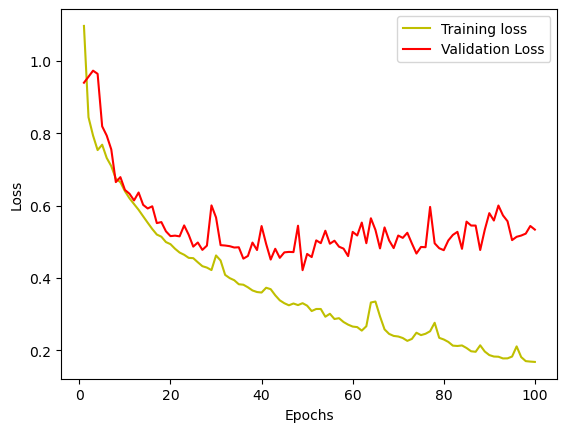

In [52]:
loss = history_a.history["loss"]
val_loss = history_a.history['val_loss']
epochs = range(1,len(loss)+1)
plt.plot(epochs,loss,'y',label="Training loss")
plt.plot(epochs,val_loss,'r',label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

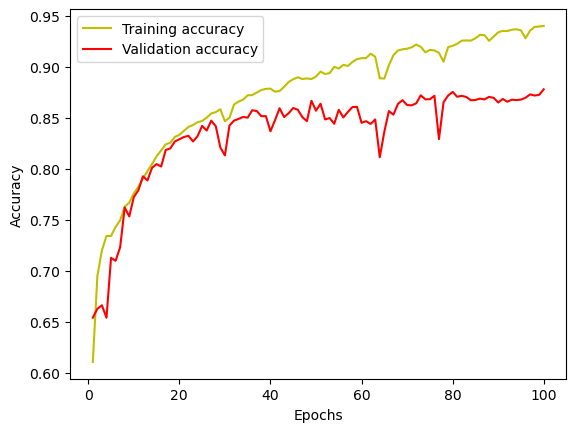

In [53]:
acc = history_a.history["accuracy"]
val_acc = history_a.history['val_accuracy']
epochs = range(1,len(loss)+1)
plt.plot(epochs,acc,'y',label="Training accuracy")
plt.plot(epochs,val_acc,'r',label="Validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

1/1 [==============================] - 1s 1s/step


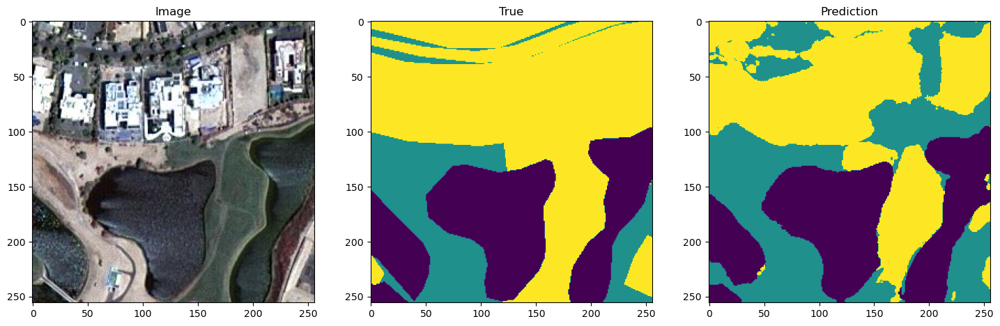

1/1 [==============================] - 0s 25ms/step


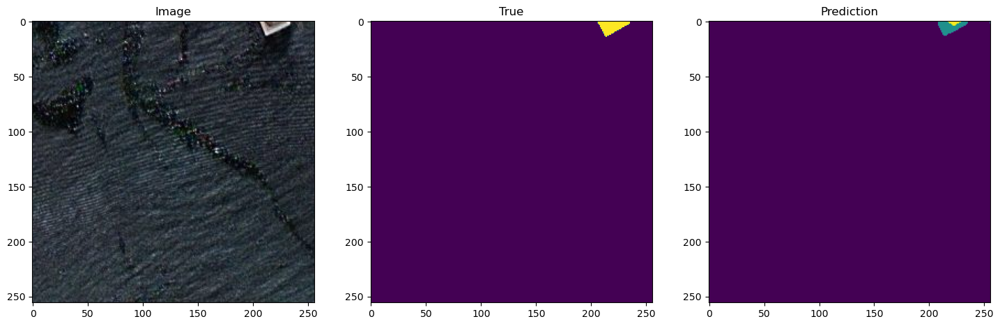

1/1 [==============================] - 0s 40ms/step


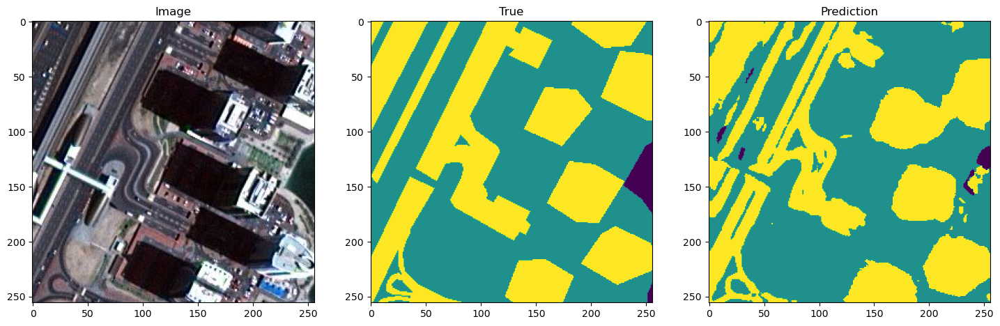

1/1 [==============================] - 0s 26ms/step


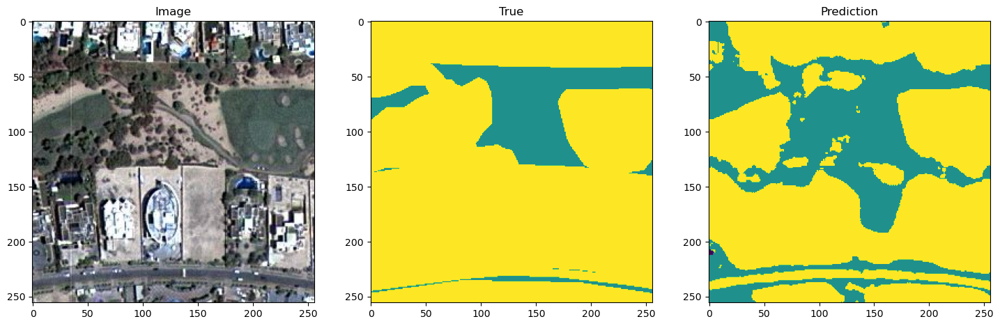

1/1 [==============================] - 0s 29ms/step


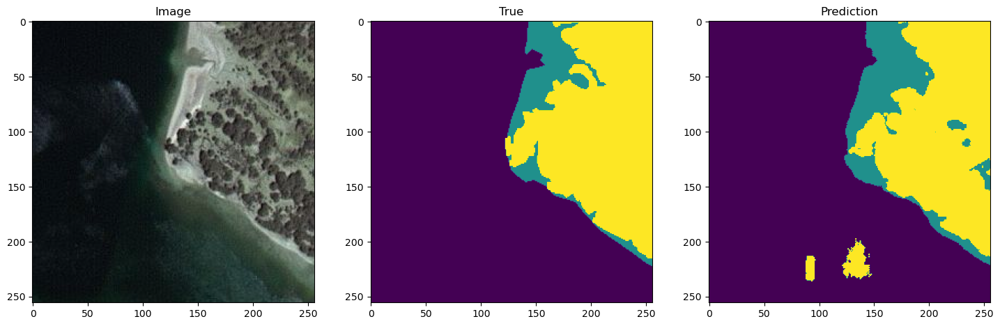

1/1 [==============================] - 0s 30ms/step


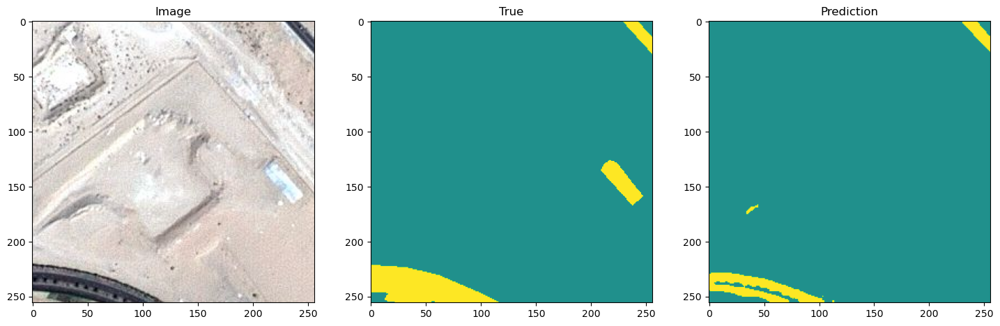

1/1 [==============================] - 0s 24ms/step


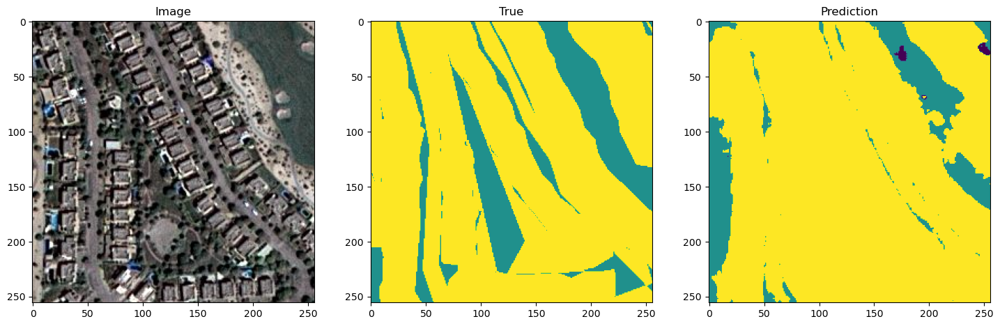

1/1 [==============================] - 0s 26ms/step


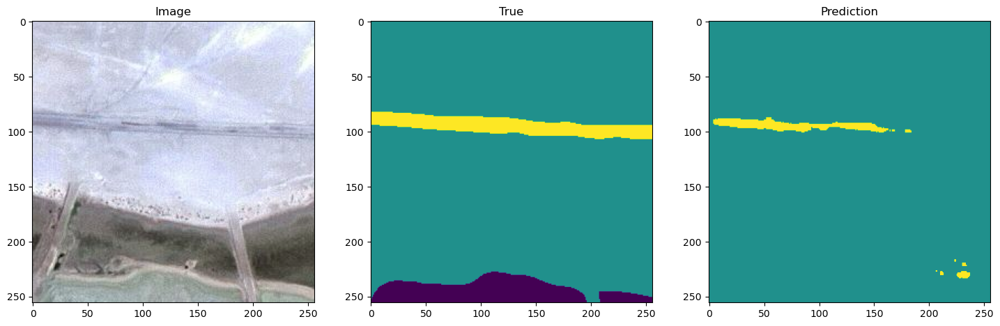

1/1 [==============================] - 0s 25ms/step


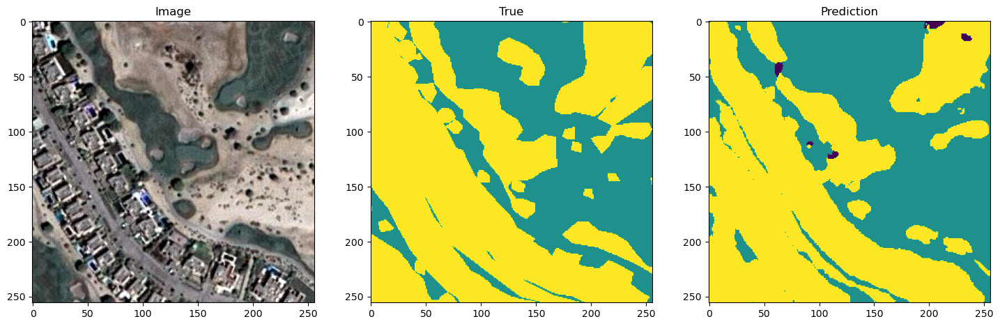

1/1 [==============================] - 0s 25ms/step


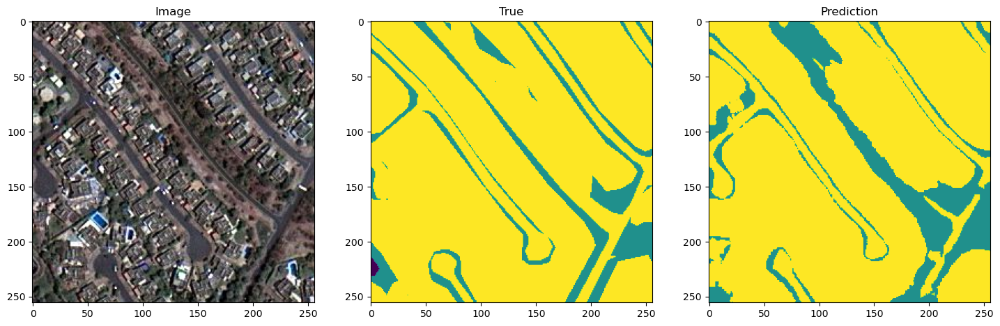

1/1 [==============================] - 0s 26ms/step


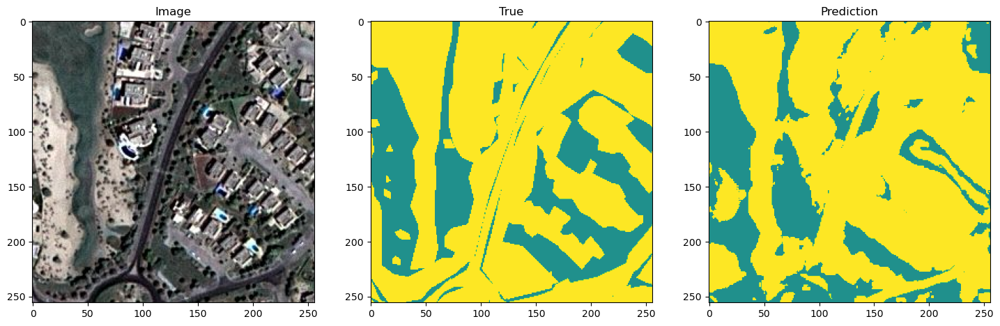

1/1 [==============================] - 0s 26ms/step


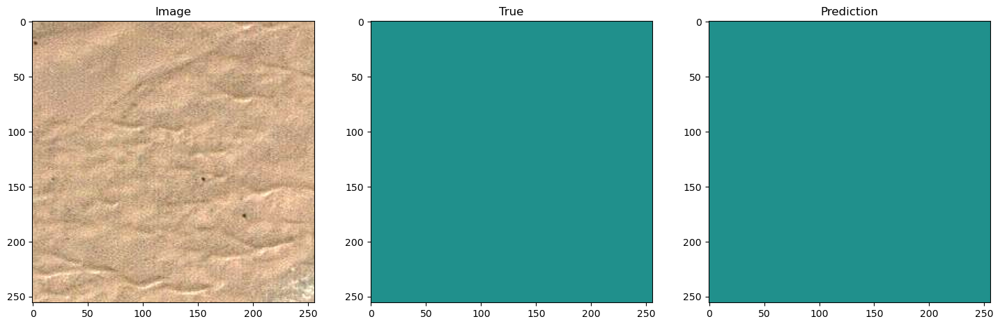

1/1 [==============================] - 0s 28ms/step


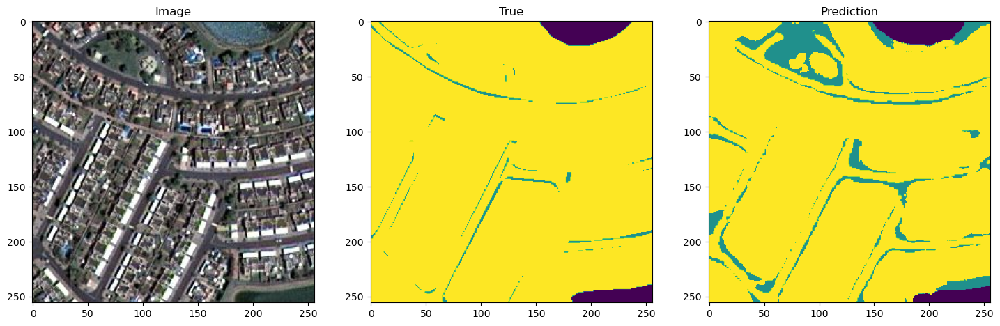

1/1 [==============================] - 0s 28ms/step


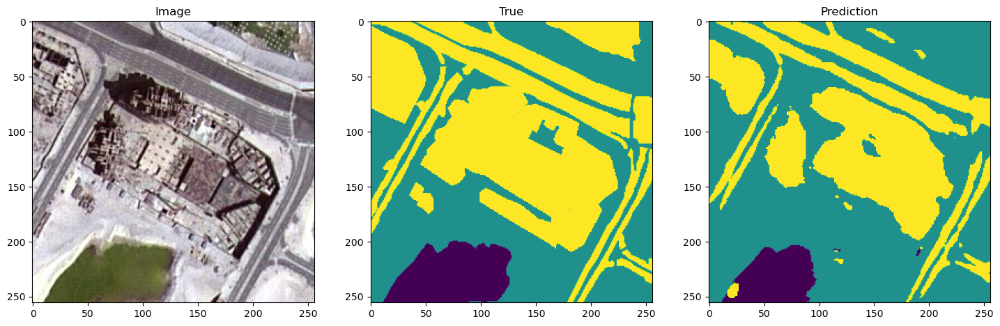

1/1 [==============================] - 0s 27ms/step


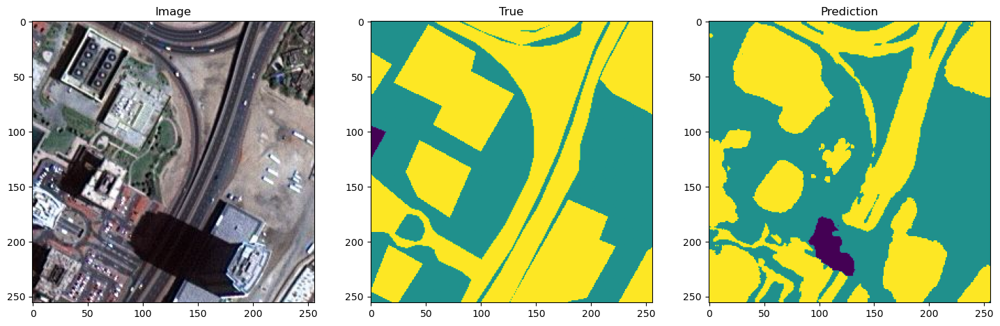

1/1 [==============================] - 0s 28ms/step


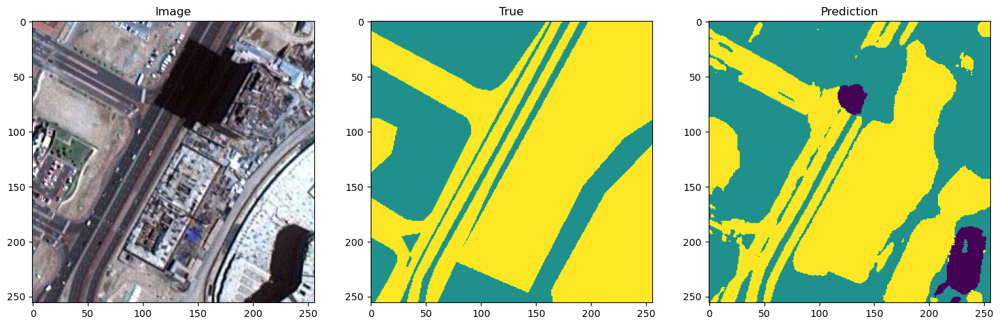

1/1 [==============================] - 0s 23ms/step


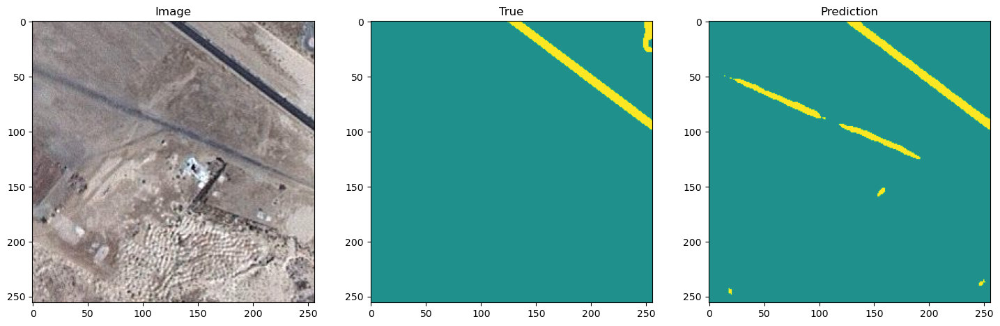

1/1 [==============================] - 0s 29ms/step


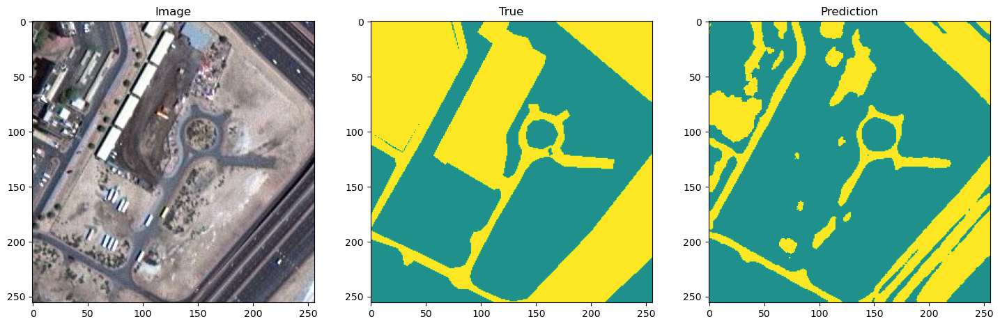

1/1 [==============================] - 0s 26ms/step


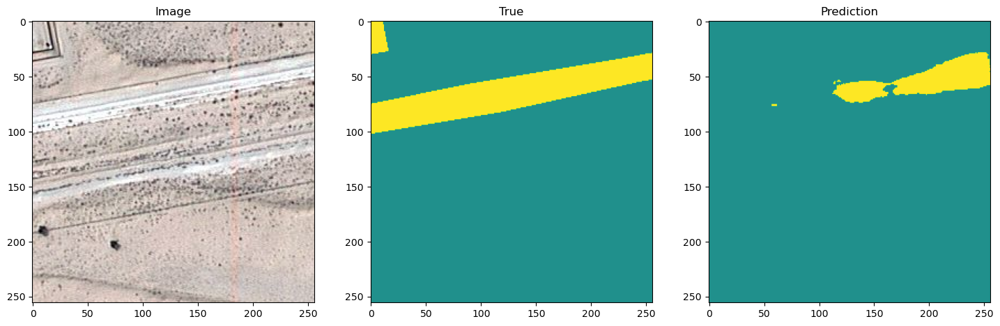

1/1 [==============================] - 0s 23ms/step


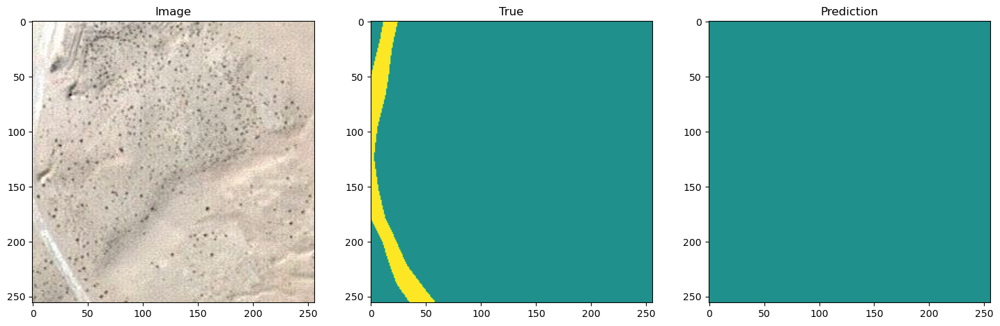

In [54]:
vmin = 0
vmax = 2

for i in range(20):
    
#     image_number = random.randint(0, X_test.shape[0])
    
    plt.figure(figsize=(24, 6))
    
    plt.subplot(141)
    plt.title('Image')
    plt.imshow(X_test[i])
    
    plt.subplot(142)
    plt.title('True')
    true = y_test[i].argmax(axis=2)
    plt.imshow(true, vmin = vmin, vmax = vmax)
    
    plt.subplot(143)
    plt.title('Prediction')
    prediction = model.predict(np.expand_dims(X_test[i], 0))[0].argmax(axis=2) # convert to 0-5 classes
    plt.imshow(prediction, vmin = vmin, vmax = vmax)
    
#     plt.subplot(144)
#     plt.title('Error')
#     error = (true != prediction) & (true != 0)
#     error = error.astype(int)
#     plt.imshow(error, cmap='gray')
    
    plt.show()


In [55]:
tf.keras.backend.clear_session()

In [56]:
model.save('infastate_segm_model.h5')


In [57]:
#IOU
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)
y_test_argmax=np.argmax(y_test, axis=3)

5/5 [==============================] - 4s 388ms/step


In [58]:
#Using built in keras function for IoU
from tensorflow.keras.metrics import MeanIoU
n_classes = 6
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test_argmax, y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.6245905


In [59]:
# import random
# for i in range (0,20):
# #     test_img_number = random.randint(0, len(X_test))
#     test_img = X_test[i]
#     ground_truth=y_test_argmax[i]
#     #test_img_norm=test_img[:,:,0][:,:,None]
#     test_img_input=np.expand_dims(test_img, 0)
#     prediction = (model.predict(test_img_input))
#     predicted_img=np.argmax(prediction, axis=3)[0,:,:]
#     plt.figure(figsize=(12, 8))
#     plt.subplot(231)
#     plt.title('Testing Image')
#     plt.imshow(test_img)
#     plt.subplot(232)
#     plt.title('Testing Label')
#     plt.imshow(ground_truth)
#     plt.subplot(233)
#     plt.title('Prediction on test image')
#     plt.imshow(predicted_img)
#     plt.show()